# Equivariant Convnext

In [1]:
%load_ext autoreload
%autoreload 2

In [ ]:
import os
import sys
import numpy as np
import torch
import torch.optim as optim
import matplotlib.pyplot as plt
import neptune
from neptune.utils import stringify_unsupported
from ruamel.yaml import YAML
from torch.amp import GradScaler, autocast
from torch.utils.data import DataLoader
from torchvision.transforms import Compose
from torchvision.transforms import RandomRotation, RandomCrop
from tqdm import tqdm
from torchvision import transforms

# ModuleNotFoundError: No module named 'multiplex_model'
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..')))

from multiplex_model.data import DatasetFromTIFF, PanelBatchSampler, TestCrop
from multiplex_model.losses import nll_loss
from multiplex_model.utils import ClampWithGrad, plot_reconstructs_with_uncertainty, get_scheduler_with_warmup
from multiplex_model.modules import MultiplexAutoencoder
from multiplex_model.run_utils import build_run_name_suffix, SLURM_JOB_ID


from src_from_rudy.utils import setup_seeds, setup_clearml, ChainDataLoader
from src_from_rudy.augmentations import ArcsinhNormalize, MinMaxNormalize, ButterworthFilter, GlobalNormalize, SelectMarkers
from src_from_rudy.config.autoencoder_cells import Config as CellsConfig
from src_from_rudy.config.multiplex_vit_no_bottleneck_autoencoder import Config as TissuesConfig
from src_from_rudy.constants import LOGDIR, IMC_PANEL2_DATA_DIR, PANEL_1_MARKER_NAMES, IMC_PANEL1_DATA_DIR, HALEY_GLIO, DANENBERG_BREAST_DIR, REQUIRED_IMG_SHAPES
from src_from_rudy.datasets.imc_datasets import CellPatchesDataModule, WholeSlidesDataModule, ContrastiveTissuePatchesDataModule, TissuePatchesDataModule


def _setup_data_loaders(data_module):
    data_module.setup('train')
    data_module.setup('test')
    train_loader = data_module.train_dataloader()
    test_loader = data_module.test_dataloader()
    return train_loader, test_loader

def _setup_data_loader(data_module) -> DataLoader:
    data_module.setup('train')
    train_loader = data_module.train_dataloader()
    return train_loader

def _get_marker_indices(markers):
    marker_indices = []
    for marker in markers:
        marker_indices.append(PANEL_1_MARKER_NAMES.index(marker))
    return marker_indices

def _create_tissue_patches_data_module(data_dir: str, batch_size: int, image_size: int):
    # patches_transform = transforms.Compose([
    #     ArcsinhNormalize(),
    #     MinMaxNormalize(),
    #     ButterworthFilter(),

    # ])
    patches_transform = transforms.Compose([
        # ArcsinhNormalize(),
        # ButterworthFilter(),
        # GlobalNormalize(),
        # SelectMarkers(_get_marker_indices(TissuesConfig.SELECTED_MARKERS)),
    ])
    patches_data_module = TissuePatchesDataModule(
        data_dir=data_dir,
        batch_size=batch_size,
        patch_size=image_size,
        transform=patches_transform,
        sample_frac=TissuesConfig.SAMPLE_FRAC,
        img_paths_file=TissuesConfig.IMG_PATHS_FILE,
        is_imc_dir=data_dir in [IMC_PANEL2_DATA_DIR, IMC_PANEL1_DATA_DIR],
        need_to_merge_single_channel_images=data_dir in [HALEY_GLIO],
        required_img_shape=REQUIRED_IMG_SHAPES[data_dir],
    )
    return patches_data_module


CONFIG_OVERRIDES = {
    "device": "cpu",  # Change to 'cuda:0' if using GPU
    "panel_config": "../configs/all_panels_config.yaml",
    "tokenizer_config": "../configs/all_markers_tokenizer.yaml"
}

global TOKENIZER, INV_TOKENIZER, PANEL_CONFIG

def apply_overrides(config, overrides):
    for key, value in overrides.items():
        if key in config:
            config[key] = value
        else:
            print(f"Warning: {key} not found in config, skipping override.")
    return config

def load_configuration(config_path):
    yaml = YAML(typ='safe')
    with open(config_path, 'r') as f:
        config = yaml.load(f)
    
    with open("../secrets/neptune.yaml", 'r') as f:
        secrets = yaml.load(f)


    device = config['device']
    print(f'Using device: {device}')
    
    prefix = config.get("run_prefix", "").strip()         # empty by default
    suffix = build_run_name_suffix()                               # always unique
    run_name = f"{prefix}_{suffix}" if prefix else suffix

    run = neptune.init_run(
        name=run_name,
        project=secrets['neptune_project'],
        api_token=secrets['neptune_api_token'],
        tags=config['tags'],
    )

    # SIZE = config['input_image_size']
    # print(f"INPUT IMAGE SIZE: {SIZE}")
    BATCH_SIZE = config['batch_size']
    NUM_WORKERS = config['num_workers']

    PANEL_CONFIG = YAML().load(open(config['panel_config']))
    TOKENIZER = YAML().load(open(config['tokenizer_config']))
    print(f"Training on datasets: {PANEL_CONFIG['datasets']}")
    MARKERS_SET = {k for dataset in PANEL_CONFIG['datasets'] for k in PANEL_CONFIG['markers'][dataset]}
    print(f"Markers set: {MARKERS_SET}")
    print(f"Number of markers: {len(MARKERS_SET)}")
    TOKENIZER = {k: v for k, v in zip(MARKERS_SET, range(len(MARKERS_SET)))}
    INV_TOKENIZER = {v: k for k, v in TOKENIZER.items()}


    model_config = {
        'num_channels': len(TOKENIZER),
        'superkernel_config': config['superkernel'],
        'encoder_config': config['encoder'],
        'decoder_config': config['decoder'],
    }


    # start of new code 
    oldConfig = TissuesConfig
    oldConfig.BATCH_SIZE = config['batch_size']
    print(oldConfig)

    train_loaders = []
    test_loaders = []
    for data_dir in oldConfig.DATA_DIRS:
        batch_size = oldConfig.BATCH_SIZE
        if data_dir == IMC_PANEL2_DATA_DIR:
            batch_size = int(batch_size / 1.1)
        image_size = oldConfig.INPUT_OUTPUT_IMAGE_SHAPE[0]

        if data_dir in [IMC_PANEL2_DATA_DIR, IMC_PANEL1_DATA_DIR]:
            # slides_data_module = _create_whole_slides_data_module(data_dir, batch_size, image_size)
            tissues_data_module = _create_tissue_patches_data_module(data_dir, batch_size, image_size)
            # slides_train_loader, slides_test_loader = _setup_data_loaders(slides_data_module)
            tissues_train_loader, tissues_test_loader = _setup_data_loaders(tissues_data_module)
            # train_loaders += [slides_train_loader, tissues_train_loader]
            # test_loaders += [slides_test_loader, tissues_test_loader]
            train_loaders += [tissues_train_loader]
            test_loaders += [tissues_test_loader]
        else:
            tissues_data_module = _create_tissue_patches_data_module(data_dir, batch_size, image_size)
            tissues_train_loader = _setup_data_loader(tissues_data_module)
            train_loaders += [tissues_train_loader]

    train_dataloader = train_loaders[0]
    test_dataloader = test_loaders[0]
    print(f'Training on {len(train_dataloader.dataset)} training samples and {len(test_dataloader.dataset)} test samples')
    # print(f'Batch size: {BATCH_SIZE}, Number of workers: {NUM_WORKERS}')

    # end of new code

    if config["model_type"] == "EquivariantConvnext":
        from multiplex_model.equivariant_modules import EquivariantMultiplexAutoencoder
        model = EquivariantMultiplexAutoencoder(**model_config).to(device)

    elif config["model_type"] == "Convnext":
        model = MultiplexAutoencoder(**model_config).to(device)

config_path = "/home/szlukasik/immu-vis/multiplex-image-model/train_masked_equivariant_config_old_loader.yaml"
model, train_dataloader, test_dataloader, TOKENIZER, INV_TOKENIZER, config = load_configuration(config_path)

FileNotFoundError: [Errno 2] No such file or directory: 'secrets/neptune.yaml'

In [3]:
config

Available objects for config:
    AliasManager
    DisplayFormatter
    HistoryManager
    IPCompleter
    IPKernelApp
    LoggingMagics
    MagicsManager
    OSMagics
    PrefilterManager
    ScriptMagics
    StoreMagics
    ZMQInteractiveShell


In [ ]:
model

In [3]:
img, channel_ids, panel_idx, img_path = next(iter(test_dataloader))
img.shape

torch.Size([4, 40, 113, 113])

In [ ]:
img.shape

torch.Size([4, 40, 112, 112])

In [6]:
# load model ckpt
ckpt_path = "checkpoints/checkpoint-IM-41-epoch_149.pth"
state_dict = torch.load(ckpt_path, map_location='cpu')

In [ ]:
model.load_state_dict(state_dict["model_state_dict"])

RuntimeError: Error(s) in loading state_dict for EquivariantMultiplexAutoencoder:
	Missing key(s) in state_dict: "encoder.poolings.0.weights", "encoder.poolings.0.bias_expansion", "encoder.poolings.0.expanded_bias", "encoder.poolings.0.filter", "encoder.poolings.0._basisexpansion.block_expansion_('irrep_0', 'regular_1').sampled_basis", "encoder.poolings.1.weights", "encoder.poolings.1.bias_expansion", "encoder.poolings.1.expanded_bias", "encoder.poolings.1.filter", "encoder.poolings.1._basisexpansion.block_expansion_('regular_1', 'regular_1').sampled_basis", "encoder.poolings.2.weights", "encoder.poolings.2.bias_expansion", "encoder.poolings.2.expanded_bias", "encoder.poolings.2.filter", "encoder.poolings.2._basisexpansion.block_expansion_('regular_1', 'regular_1').sampled_basis", "encoder.acts.0.log_bias", "encoder.acts.0.eps", "encoder.acts.0.indices_3", "encoder.acts.1.log_bias", "encoder.acts.1.eps", "encoder.acts.1.indices_3", "encoder.acts.2.log_bias", "encoder.acts.2.eps", "encoder.acts.2.indices_3", "encoder.blocks.0.blocks.0.depthwise.bias", "encoder.blocks.0.blocks.0.depthwise.weights", "encoder.blocks.0.blocks.0.depthwise.bias_expansion", "encoder.blocks.0.blocks.0.depthwise.expanded_bias", "encoder.blocks.0.blocks.0.depthwise.filter", "encoder.blocks.0.blocks.0.depthwise._basisexpansion.block_expansion_('regular_1', 'regular_1').sampled_basis", "encoder.blocks.0.blocks.0.norm.regular_1_weight", "encoder.blocks.0.blocks.0.norm.regular_1_bias", "encoder.blocks.0.blocks.0.norm.regular_1_avg", "encoder.blocks.0.blocks.0.norm.regular_1_change_of_basis", "encoder.blocks.0.blocks.0.norm.regular_1_running_mean", "encoder.blocks.0.blocks.0.norm.regular_1_running_var", "encoder.blocks.0.blocks.0.norm.num_batches_tracked", "encoder.blocks.0.blocks.0.pw_up.bias", "encoder.blocks.0.blocks.0.pw_up.weights", "encoder.blocks.0.blocks.0.pw_up.bias_expansion", "encoder.blocks.0.blocks.0.pw_up.expanded_bias", "encoder.blocks.0.blocks.0.pw_up.filter", "encoder.blocks.0.blocks.0.pw_up._basisexpansion.block_expansion_('regular_1', 'regular_1').sampled_basis", "encoder.blocks.0.blocks.0.gelu.log_bias", "encoder.blocks.0.blocks.0.gelu.eps", "encoder.blocks.0.blocks.0.gelu.indices_3", "encoder.blocks.0.blocks.0.pw_down.bias", "encoder.blocks.0.blocks.0.pw_down.weights", "encoder.blocks.0.blocks.0.pw_down.bias_expansion", "encoder.blocks.0.blocks.0.pw_down.expanded_bias", "encoder.blocks.0.blocks.0.pw_down.filter", "encoder.blocks.0.blocks.0.pw_down._basisexpansion.block_expansion_('regular_1', 'regular_1').sampled_basis", "encoder.blocks.1.blocks.0.depthwise.bias", "encoder.blocks.1.blocks.0.depthwise.weights", "encoder.blocks.1.blocks.0.depthwise.bias_expansion", "encoder.blocks.1.blocks.0.depthwise.expanded_bias", "encoder.blocks.1.blocks.0.depthwise.filter", "encoder.blocks.1.blocks.0.depthwise._basisexpansion.block_expansion_('regular_1', 'regular_1').sampled_basis", "encoder.blocks.1.blocks.0.norm.regular_1_weight", "encoder.blocks.1.blocks.0.norm.regular_1_bias", "encoder.blocks.1.blocks.0.norm.regular_1_avg", "encoder.blocks.1.blocks.0.norm.regular_1_change_of_basis", "encoder.blocks.1.blocks.0.norm.regular_1_running_mean", "encoder.blocks.1.blocks.0.norm.regular_1_running_var", "encoder.blocks.1.blocks.0.norm.num_batches_tracked", "encoder.blocks.1.blocks.0.pw_up.bias", "encoder.blocks.1.blocks.0.pw_up.weights", "encoder.blocks.1.blocks.0.pw_up.bias_expansion", "encoder.blocks.1.blocks.0.pw_up.expanded_bias", "encoder.blocks.1.blocks.0.pw_up.filter", "encoder.blocks.1.blocks.0.pw_up._basisexpansion.block_expansion_('regular_1', 'regular_1').sampled_basis", "encoder.blocks.1.blocks.0.gelu.log_bias", "encoder.blocks.1.blocks.0.gelu.eps", "encoder.blocks.1.blocks.0.gelu.indices_3", "encoder.blocks.1.blocks.0.pw_down.bias", "encoder.blocks.1.blocks.0.pw_down.weights", "encoder.blocks.1.blocks.0.pw_down.bias_expansion", "encoder.blocks.1.blocks.0.pw_down.expanded_bias", "encoder.blocks.1.blocks.0.pw_down.filter", "encoder.blocks.1.blocks.0.pw_down._basisexpansion.block_expansion_('regular_1', 'regular_1').sampled_basis", "encoder.blocks.2.blocks.0.depthwise.bias", "encoder.blocks.2.blocks.0.depthwise.weights", "encoder.blocks.2.blocks.0.depthwise.bias_expansion", "encoder.blocks.2.blocks.0.depthwise.expanded_bias", "encoder.blocks.2.blocks.0.depthwise.filter", "encoder.blocks.2.blocks.0.depthwise._basisexpansion.block_expansion_('regular_1', 'regular_1').sampled_basis", "encoder.blocks.2.blocks.0.norm.regular_1_weight", "encoder.blocks.2.blocks.0.norm.regular_1_bias", "encoder.blocks.2.blocks.0.norm.regular_1_avg", "encoder.blocks.2.blocks.0.norm.regular_1_change_of_basis", "encoder.blocks.2.blocks.0.norm.regular_1_running_mean", "encoder.blocks.2.blocks.0.norm.regular_1_running_var", "encoder.blocks.2.blocks.0.norm.num_batches_tracked", "encoder.blocks.2.blocks.0.pw_up.bias", "encoder.blocks.2.blocks.0.pw_up.weights", "encoder.blocks.2.blocks.0.pw_up.bias_expansion", "encoder.blocks.2.blocks.0.pw_up.expanded_bias", "encoder.blocks.2.blocks.0.pw_up.filter", "encoder.blocks.2.blocks.0.pw_up._basisexpansion.block_expansion_('regular_1', 'regular_1').sampled_basis", "encoder.blocks.2.blocks.0.gelu.log_bias", "encoder.blocks.2.blocks.0.gelu.eps", "encoder.blocks.2.blocks.0.gelu.indices_3", "encoder.blocks.2.blocks.0.pw_down.bias", "encoder.blocks.2.blocks.0.pw_down.weights", "encoder.blocks.2.blocks.0.pw_down.bias_expansion", "encoder.blocks.2.blocks.0.pw_down.expanded_bias", "encoder.blocks.2.blocks.0.pw_down.filter", "encoder.blocks.2.blocks.0.pw_down._basisexpansion.block_expansion_('regular_1', 'regular_1').sampled_basis", "encoder.regular2trivial.proj.bias", "encoder.regular2trivial.proj.weights", "encoder.regular2trivial.proj.bias_expansion", "encoder.regular2trivial.proj.expanded_bias", "encoder.regular2trivial.proj.filter", "encoder.regular2trivial.proj._basisexpansion.block_expansion_('regular_1', 'irrep_0').sampled_basis". 
	Unexpected key(s) in state_dict: "encoder.poolings.0.weight", "encoder.poolings.1.weight", "encoder.poolings.2.weight", "encoder.blocks.0.0.conv1.weight", "encoder.blocks.0.0.conv1.bias", "encoder.blocks.0.0.ln.weight", "encoder.blocks.0.0.ln.bias", "encoder.blocks.0.0.conv2.weight", "encoder.blocks.0.0.conv2.bias", "encoder.blocks.0.0.grn.gamma", "encoder.blocks.0.0.grn.beta", "encoder.blocks.0.0.conv3.weight", "encoder.blocks.0.0.conv3.bias", "encoder.blocks.0.1.conv1.weight", "encoder.blocks.0.1.conv1.bias", "encoder.blocks.0.1.ln.weight", "encoder.blocks.0.1.ln.bias", "encoder.blocks.0.1.conv2.weight", "encoder.blocks.0.1.conv2.bias", "encoder.blocks.0.1.grn.gamma", "encoder.blocks.0.1.grn.beta", "encoder.blocks.0.1.conv3.weight", "encoder.blocks.0.1.conv3.bias", "encoder.blocks.0.2.conv1.weight", "encoder.blocks.0.2.conv1.bias", "encoder.blocks.0.2.ln.weight", "encoder.blocks.0.2.ln.bias", "encoder.blocks.0.2.conv2.weight", "encoder.blocks.0.2.conv2.bias", "encoder.blocks.0.2.grn.gamma", "encoder.blocks.0.2.grn.beta", "encoder.blocks.0.2.conv3.weight", "encoder.blocks.0.2.conv3.bias", "encoder.blocks.1.0.conv1.weight", "encoder.blocks.1.0.conv1.bias", "encoder.blocks.1.0.ln.weight", "encoder.blocks.1.0.ln.bias", "encoder.blocks.1.0.conv2.weight", "encoder.blocks.1.0.conv2.bias", "encoder.blocks.1.0.grn.gamma", "encoder.blocks.1.0.grn.beta", "encoder.blocks.1.0.conv3.weight", "encoder.blocks.1.0.conv3.bias", "encoder.blocks.1.1.conv1.weight", "encoder.blocks.1.1.conv1.bias", "encoder.blocks.1.1.ln.weight", "encoder.blocks.1.1.ln.bias", "encoder.blocks.1.1.conv2.weight", "encoder.blocks.1.1.conv2.bias", "encoder.blocks.1.1.grn.gamma", "encoder.blocks.1.1.grn.beta", "encoder.blocks.1.1.conv3.weight", "encoder.blocks.1.1.conv3.bias", "encoder.blocks.1.2.conv1.weight", "encoder.blocks.1.2.conv1.bias", "encoder.blocks.1.2.ln.weight", "encoder.blocks.1.2.ln.bias", "encoder.blocks.1.2.conv2.weight", "encoder.blocks.1.2.conv2.bias", "encoder.blocks.1.2.grn.gamma", "encoder.blocks.1.2.grn.beta", "encoder.blocks.1.2.conv3.weight", "encoder.blocks.1.2.conv3.bias", "encoder.blocks.2.0.conv1.weight", "encoder.blocks.2.0.conv1.bias", "encoder.blocks.2.0.ln.weight", "encoder.blocks.2.0.ln.bias", "encoder.blocks.2.0.conv2.weight", "encoder.blocks.2.0.conv2.bias", "encoder.blocks.2.0.grn.gamma", "encoder.blocks.2.0.grn.beta", "encoder.blocks.2.0.conv3.weight", "encoder.blocks.2.0.conv3.bias", "encoder.blocks.2.1.conv1.weight", "encoder.blocks.2.1.conv1.bias", "encoder.blocks.2.1.ln.weight", "encoder.blocks.2.1.ln.bias", "encoder.blocks.2.1.conv2.weight", "encoder.blocks.2.1.conv2.bias", "encoder.blocks.2.1.grn.gamma", "encoder.blocks.2.1.grn.beta", "encoder.blocks.2.1.conv3.weight", "encoder.blocks.2.1.conv3.bias", "encoder.blocks.2.2.conv1.weight", "encoder.blocks.2.2.conv1.bias", "encoder.blocks.2.2.ln.weight", "encoder.blocks.2.2.ln.bias", "encoder.blocks.2.2.conv2.weight", "encoder.blocks.2.2.conv2.bias", "encoder.blocks.2.2.grn.gamma", "encoder.blocks.2.2.grn.beta", "encoder.blocks.2.2.conv3.weight", "encoder.blocks.2.2.conv3.bias", "decoder.decoder.1.conv1.weight", "decoder.decoder.1.conv1.bias", "decoder.decoder.1.ln.weight", "decoder.decoder.1.ln.bias", "decoder.decoder.1.conv2.weight", "decoder.decoder.1.conv2.bias", "decoder.decoder.1.grn.gamma", "decoder.decoder.1.grn.beta", "decoder.decoder.1.conv3.weight", "decoder.decoder.1.conv3.bias", "decoder.decoder.2.conv1.weight", "decoder.decoder.2.conv1.bias", "decoder.decoder.2.ln.weight", "decoder.decoder.2.ln.bias", "decoder.decoder.2.conv2.weight", "decoder.decoder.2.conv2.bias", "decoder.decoder.2.grn.gamma", "decoder.decoder.2.grn.beta", "decoder.decoder.2.conv3.weight", "decoder.decoder.2.conv3.bias". 
	size mismatch for encoder.poolings.0.bias: copying a param with shape torch.Size([192]) from checkpoint, the shape in current model is torch.Size([100]).
	size mismatch for encoder.poolings.1.bias: copying a param with shape torch.Size([384]) from checkpoint, the shape in current model is torch.Size([200]).
	size mismatch for encoder.poolings.2.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([400]).
	size mismatch for decoder.channel_embed.weight: copying a param with shape torch.Size([203, 393216]) from checkpoint, the shape in current model is torch.Size([203, 204800]).

In [7]:
min_channels_frac = 0.5
device = model.parameters().__next__().device  # Get the device from model parameters
rand_gen = torch.Generator().manual_seed(42)

batch_size, num_channels, H, W = img.shape
min_channels = int(np.ceil(num_channels * min_channels_frac))
if min_channels < num_channels:
    num_sampled_channels = torch.randint(min_channels, num_channels, (1,), generator=rand_gen).item()
else:
    num_sampled_channels = num_channels

channels_subset_idx = [
    np.random.choice(
        np.arange(num_channels), 
        size=(1, num_sampled_channels), 
        replace=False,
    ) for _ in range(batch_size)
]

channels_subset_indices = np.concatenate(channels_subset_idx, axis=0)
channels_subset_indices = torch.tensor(channels_subset_indices, dtype=torch.long)

channels_subset_indices = channels_subset_indices.unsqueeze(-1).unsqueeze(-1).expand(-1, -1, H, W)  # Shape: [batch_size, num_sampled_channels, H, W]
masked_img = torch.gather(img, dim=1, index=channels_subset_indices).to(device)  # Gather the selected channels

# Gather corresponding channel IDs
active_channel_ids = torch.gather(channel_ids, dim=1, index=channels_subset_indices[:, :, 0, 0]).to(device)

channel_ids = channel_ids.to(device)
masked_img = masked_img.to(torch.float32)
img = img.to(device)

with torch.no_grad():
    output = model(masked_img, active_channel_ids, channel_ids, True)
    features = output["features"]
    reconstructions = output["output"]
mi, logsigma = reconstructions.unbind(dim=-1)
mi = torch.sigmoid(mi)

Latent shape: torch.Size([4, 40, 15, 15])


In [10]:
reconstructions[:, :, 3:-4, 3:-4].shape

torch.Size([4, 40, 113, 113, 2])

In [6]:
type(features)

list

In [7]:
len(features)

4

In [8]:
for f in features:
    print(f.shape)

torch.Size([4, 40, 96])
torch.Size([4, 30, 56, 56])
torch.Size([4, 60, 28, 28])
torch.Size([4, 40, 14, 14])


In [13]:
import torchvision
ROTATION = 90
# rotated_img = torchvision.transforms.functional.rotate(img, ROTATION)
# RuntimeError: Input type (double) and bias type (float) should be the same
rotated_img = torch.rot90(masked_img, k=ROTATION // 90, dims=(-2, -1)).to(dtype=torch.float32)

with torch.no_grad():
    rotated_output = model(rotated_img, active_channel_ids, channel_ids, True)
    rotated_features = rotated_output["features"]
    rotated_reconstructions = rotated_output["output"]
rotated_mi, rotated_logsigma = rotated_reconstructions.unbind(dim=-1)
rotated_mi = torch.sigmoid(rotated_mi)


Latent shape: torch.Size([4, 40, 15, 15])


In [29]:
rotated_reconstructions.shape

torch.Size([4, 40, 112, 112, 2])

Latent shape: torch.Size([4, 40, 15, 15]), Rotated latent shape: torch.Size([4, 40, 15, 15])


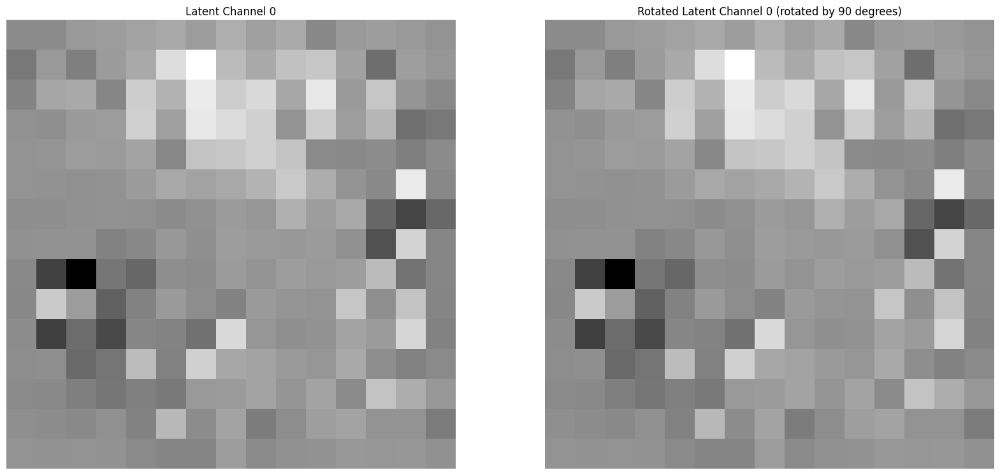

In [14]:
import matplotlib.pyplot as plt
def plot_latents(output, rotated_output, rotation=90, layer_idx=-1, chanel_idx=0):
    latent = output["features"][layer_idx]
    rotated_latent = rotated_output["features"][layer_idx]
    print( f"Latent shape: {latent.shape}, Rotated latent shape: {rotated_latent.shape}")
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(latent[0, chanel_idx].cpu().numpy(), cmap='gray')
    plt.title(f'Latent Channel {chanel_idx}')
    plt.axis('off')

    # rotated_latent_rotated_back = torchvision.transforms.functional.rotate(rotated_latent, -rotation)
    rotated_latent_rotated_back = torch.rot90(rotated_latent, k=-rotation // 90, dims=(-2, -1)) if rotation % 90 == 0 else torchvision.transforms.functional.rotate(rotated_latent, -rotation)
    plt.subplot(1, 2, 2)
    plt.imshow(rotated_latent_rotated_back[0, chanel_idx].cpu().numpy(), cmap='gray')
    plt.title(f'Rotated Latent Channel {chanel_idx} (rotated by {rotation} degrees)')
    plt.axis('off')

    plt.show()

plot_latents(output, rotated_output, rotation=ROTATION, chanel_idx=0)

Latent shape: torch.Size([4, 40, 14, 14]), Rotated latent shape: torch.Size([4, 40, 14, 14])


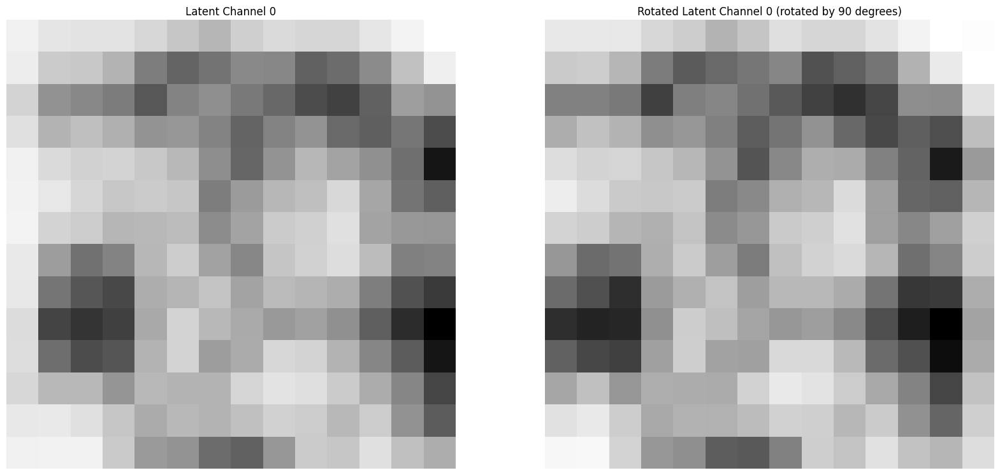

In [27]:
import matplotlib.pyplot as plt
def plot_latents(output, rotated_output, rotation=90, layer_idx=-1, chanel_idx=0):
    latent = output["features"][layer_idx]
    rotated_latent = rotated_output["features"][layer_idx]
    print( f"Latent shape: {latent.shape}, Rotated latent shape: {rotated_latent.shape}")
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(latent[0, chanel_idx].cpu().numpy(), cmap='gray')
    plt.title(f'Latent Channel {chanel_idx}')
    plt.axis('off')

    # rotated_latent_rotated_back = torchvision.transforms.functional.rotate(rotated_latent, -rotation)
    rotated_latent_rotated_back = torch.rot90(rotated_latent, k=-rotation // 90, dims=(-2, -1)) if rotation % 90 == 0 else torchvision.transforms.functional.rotate(rotated_latent, -rotation)
    plt.subplot(1, 2, 2)
    plt.imshow(rotated_latent_rotated_back[0, chanel_idx].cpu().numpy(), cmap='gray')
    plt.title(f'Rotated Latent Channel {chanel_idx} (rotated by {rotation} degrees)')
    plt.axis('off')

    plt.show()

plot_latents(output, rotated_output, rotation=ROTATION, chanel_idx=0)

Latent shape: torch.Size([4, 40, 14, 14]), Rotated latent shape: torch.Size([4, 40, 14, 14])


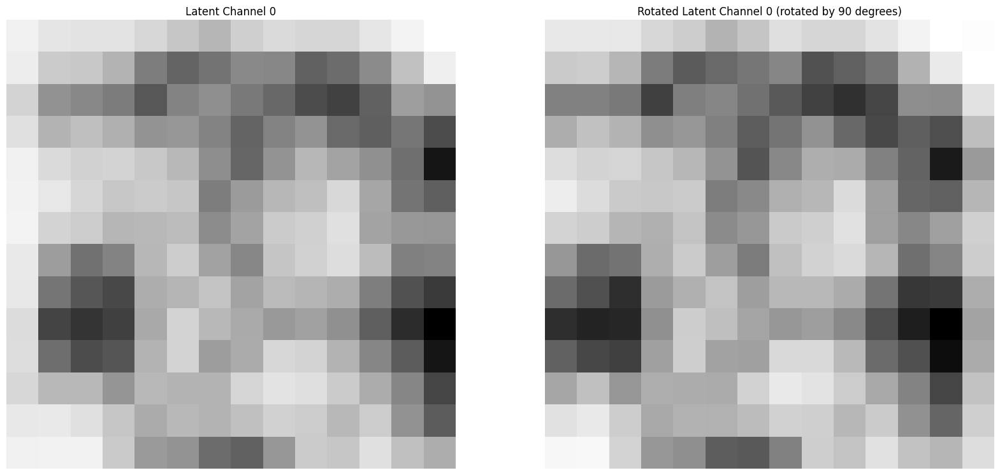

In [36]:
plot_latents(output, rotated_output, rotation=ROTATION, chanel_idx=0)

In [15]:
import math, torch, torchvision.transforms.functional as TF
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np

def rotate_tensor_affine(x, theta_deg, mode='bilinear'):
    theta = math.radians(theta_deg)
    B, C, H, W = x.shape
    # build homogeneous 3×3:  T_back · R · T_center
    cx, cy = (W-1)/2, (H-1)/2
    R = torch.tensor([[ math.cos(theta), -math.sin(theta), 0.],
                      [ math.sin(theta),  math.cos(theta), 0.],
                      [                0,               0, 1.]],
                     device=x.device, dtype=x.dtype)
    T = torch.tensor([[1, 0, -cx],
                      [0, 1, -cy],
                      [0, 0,   1]], device=x.device, dtype=x.dtype)
    T_back = torch.tensor([[1, 0, cx],
                           [0, 1, cy],
                           [0, 0,  1]], device=x.device, dtype=x.dtype)
    M = (T_back @ R @ T)[:2]                    # drop last row
    M = M.unsqueeze(0).repeat(B,1,1)            # (B,2,3)
    grid = F.affine_grid(M, x.size(), align_corners=False)
    return F.grid_sample(x, grid, mode=mode, padding_mode='zeros',
                         align_corners=False)

def circular_mask(H, W, device):
    """Largest inscribed circle for an H×W map."""
    Y, X = torch.meshgrid(torch.arange(H, device=device),
                          torch.arange(W, device=device),
                          indexing='ij')
    r2 = (X - W//2)**2 + (Y - H//2)**2
    return (r2 <= (min(H, W)//2)**2).float()          # (H,W)

def latent_equivariance_error(z0, zθ_back, theta_deg, use_mask=True):
    if use_mask:
        mask = circular_mask(*z0.shape[-2:], z0.device)
        z0, zθ_back = z0*mask, zθ_back*mask
    return (z0 - zθ_back).abs().mean() / z0.abs().mean()


# latent_rot_back = rotate_tensor_affine(rotated_features[-1], -ROTATION)
latent_rot_back = torch.rot90(rotated_features[-1], k=-ROTATION // 90, dims=(-2, -1)).to(dtype=torch.float32)


latent_equivariance_error(features[-1], latent_rot_back, ROTATION, use_mask=False)

tensor(1.1950e-06)

In [ ]:
latent_equivariance_error(features[-1], rotate_tensor_affine(rotated_features[-1], -ROTATION), ROTATION, use_mask=False)

Latent shape: torch.Size([4, 40, 14, 14]), Rotated latent shape: torch.Size([4, 40, 14, 14])


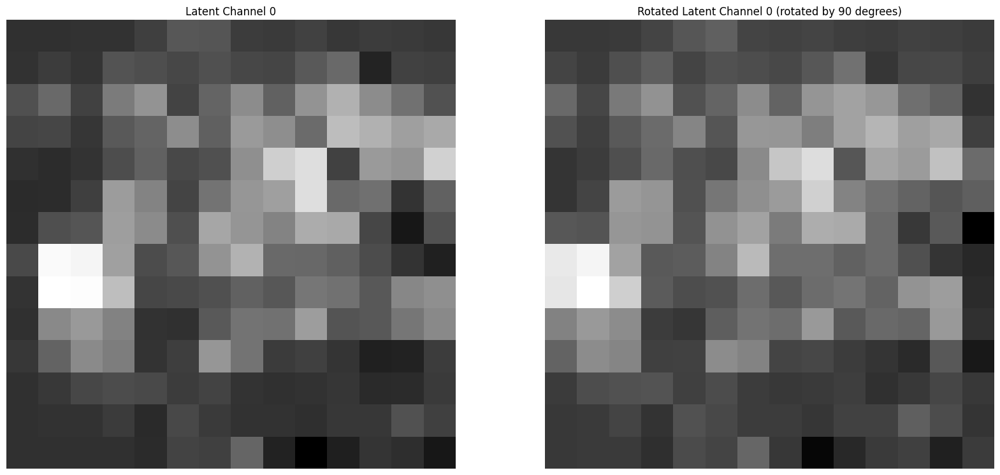

In [23]:
plot_latents(output, rotated_output, rotation=ROTATION, chanel_idx=0)

/home/szlukasik/venvs/immu-vis/lib/python3.12/site-packages/matplotlib/colors.py:2295: RuntimeWarning: invalid value encountered in divide
  resdat /= (vmax - vmin)


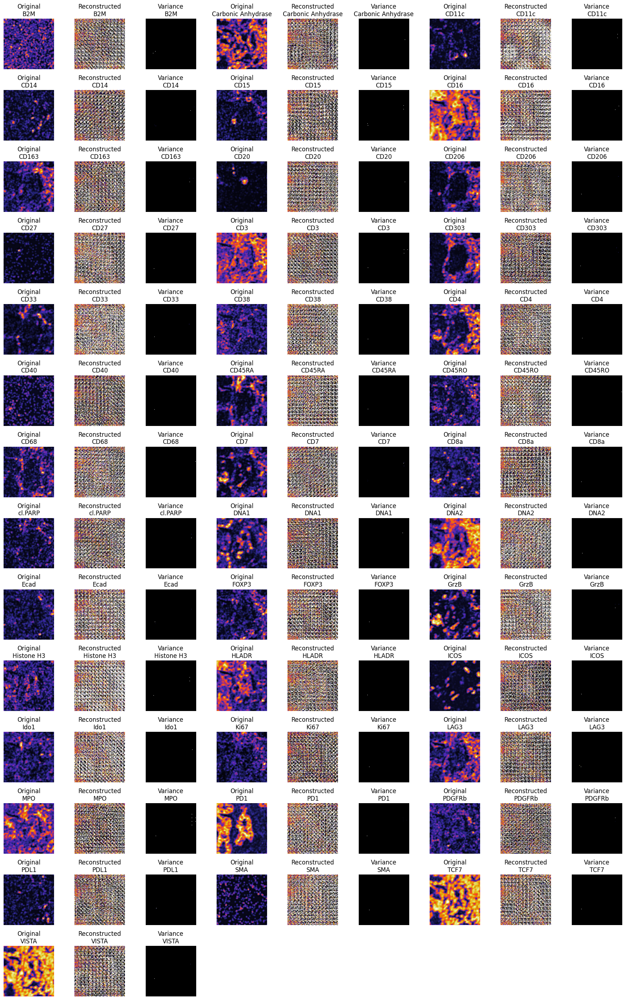

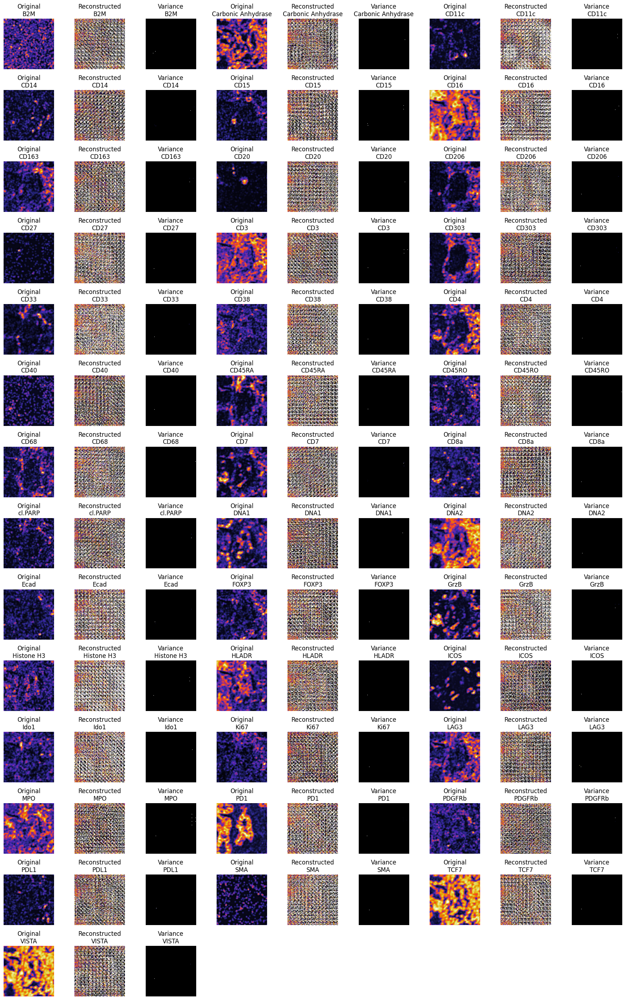

In [ ]:
from multiplex_model.utils import plot_reconstructs_with_uncertainty
# def plot_reconstructs_with_uncertainty(
#         orig_img: torch.Tensor, 
#         reconstructed_img: torch.Tensor, 
#         sigma_plot: torch.Tensor,
#         channel_ids: torch.Tensor,
#         masked_ids: torch.Tensor, 
#         markers_names_map: Dict[int, str], 
#         ncols: int = 9,
#         scale_by_max: bool = True,
#     ):
uncertainty_img = torch.exp(logsigma)
unactive_channels = [i for i in channel_ids[0] if i not in active_channel_ids[0]]
masked_channels_names = '\n'.join([INV_TOKENIZER[i.item()] for i in unactive_channels])

plot_reconstructs_with_uncertainty(
    img,
    mi,
    uncertainty_img,
    channel_ids,
    unactive_channels,
    markers_names_map=INV_TOKENIZER,
    scale_by_max=True
)